In [1]:
import numpy as np
import jax.numpy as jnp
import jax


from mpl_toolkits.axes_grid1 import ImageGrid
import matplotlib.pyplot as plt
import nmu
from circuitmap import NeuralDemixer

import sys
sys.path.append('../')
import grid_utils as util

plt.rcParams['figure.dpi'] = 300

/Users/Bantin/anaconda3/envs/circuitmap/lib/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Fig 1

In [2]:
data_path = '../data/masato/B6WT_AAV_hsyn_chrome2f_gcamp8/preprocessed/220308_B6_Chrome2fGC8_030822_Cell2_opsPositive_A_grid.npz'
dat = np.load(data_path, allow_pickle='True')
stim = dat['stim_matrix']



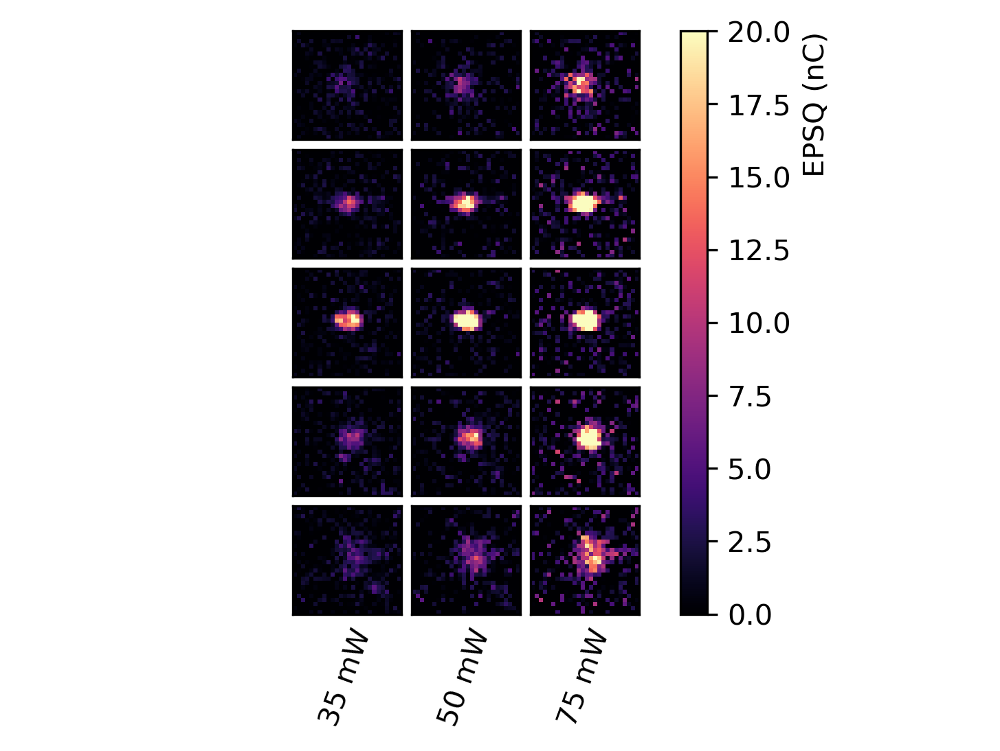

In [3]:

from sklearn.linear_model import Lasso

def naive_lasso_map(y, I, stim, penalties, grid_dims=(26, 26, 5)):
    powers = np.unique(I)
    num_powers = len(powers)
    mean_map = np.zeros((num_powers, *grid_dims))
    for power_idx, power in enumerate(powers):
        lasso = Lasso(alpha=penalties[power_idx])
        these_trials = (I == power)
        A_curr = (stim.T)[these_trials]
        y_curr = y[these_trials]
        lasso.fit(A_curr > 0, y_curr)
        x_hat_cur = lasso.coef_
        mean_map[power_idx,...] = x_hat_cur.reshape(grid_dims)

    return mean_map

stim, pscs, I, L = dat['stim_matrix'], dat['psc'], dat['I'], dat['L']
I = I.T.reshape(-1)
y = pscs.sum(1)

# naively make map with lasso for visualization
grid_mean = naive_lasso_map(y, I, stim, penalties=[1e-4,1e-3,1e-3])


fig = plt.figure(figsize=(6, 0.75 * 5), dpi=300, facecolor='white')

util.plot_multi_means(fig,
    [grid_mean], np.arange(5),
#     map_names=['subtracted'],
    cmaps=['magma', 'magma'],
    cbar_labels=['EPSQ (nC)'],
    vranges=[(0,20)],
    powers=np.unique(I))

## Visualize ROI

We expand the ROI to explicitly include a connected cell. Double check here that the ROI is where we want. 

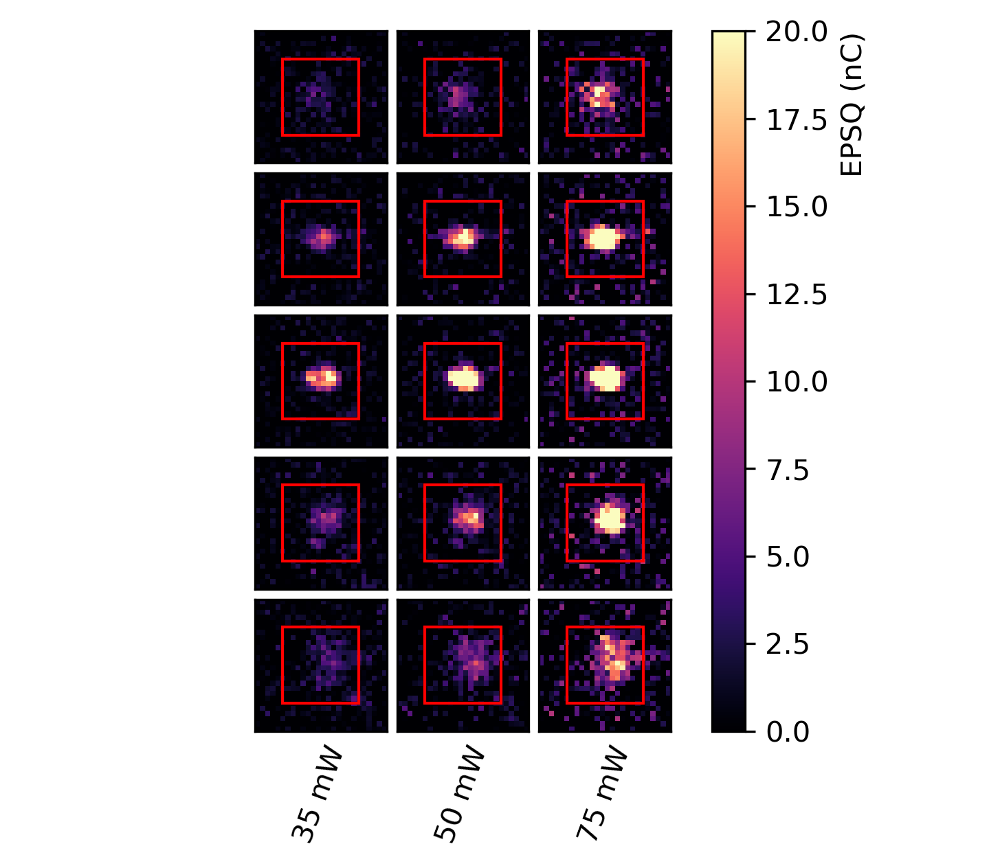

In [4]:
L_unrolled = L.reshape(-1, 3)
unique_xs, unique_ys, unique_zs = np.unique(L_unrolled[:,0]), np.unique(L_unrolled[:,1]), np.unique(L_unrolled[:,2])

# psc_tensor = util.make_psc_tensor(pscs, I, L)
ps = np.arange(3)
xs = np.arange(5,20)
ys = np.arange(5,20)
zs = np.arange(len(unique_zs))
t_max = 900

P, X, Y, Z = np.meshgrid(ps, xs, ys, zs, indexing='ij')
# roi_tensor = psc_tensor[P,X,Y,Z,:,0:t_max] # don't know how to make roi_tensor for multispot yet


# plot map then add ROI
fig = plt.figure(figsize=(6, 0.75 * 6), dpi=300, facecolor='white')

util.plot_multi_means(fig,
    [grid_mean], np.arange(5),
#     map_names=['subtracted'],
    cmaps=['magma', 'magma'],
    cbar_labels=['EPSQ (nC)'],
    vranges=[(0,20)],
    powers=np.unique(I))

# num_planes = psc_tensor.shape[3]
num_planes = grid_mean.shape[3]
axs = fig.axes
from matplotlib.patches import Rectangle
rects = [Rectangle((ys[0],xs[0]), len(ys), len(xs), edgecolor='r', facecolor='None') for _ in range(3 * num_planes)]

for (ax, rect) in zip(axs[1:1 + (3 * num_planes)], rects):
    ax.add_patch(rect)

# Isolating an ROI in the multispot case
It's not immediately obvious how to isolate an ROI in the multispot case.
One idea would be to say that a particular hologram was _not_ part of the ROI (i.e can be excluded) if none of its spots were inside the ROI. However, are there even any hologams for which this is the case? We compute this below.

After running the two cells below, `idxs_exclude` should be the indices of the holograms (out of 5000 unique holos) which do not hit the ROI at all. We see that, unfortunately, this is a very small number so excluding them from the photocurrent subtraction won't really help us.

In [5]:
X_roi, Y_roi, Z_roi = np.meshgrid(unique_xs[xs], unique_ys[ys], unique_zs[zs], indexing='ij')
roi_grid = np.c_[X_roi.flatten(), Y_roi.flatten(), Z_roi.flatten()]

In [6]:
matches = (L_unrolled[:, None] == roi_grid).all(-1).any(-1)
idxs_exclude = np.where(~np.any(matches.reshape(L.shape[0:2]), axis=-1))[0]
len(idxs_exclude)


50

Text(0, 0.5, 'current (nA)')

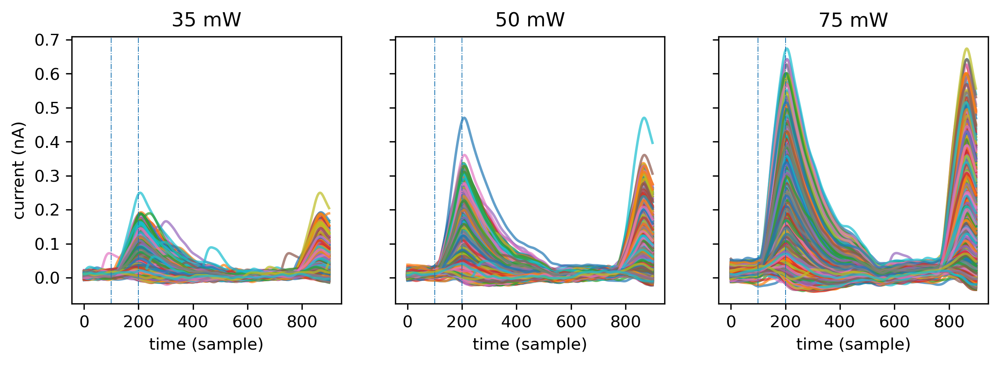

In [7]:
# import seaborn as sns

powers = np.unique(I)
fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(10,3), sharey=True, dpi=300, sharex=True)
for i in range(3):
        axs[i].plot(pscs[I == powers[i]].T, alpha=0.7,)
        axs[i].axvline(x=100, linestyle='-.', linewidth=0.5)
        axs[i].axvline(x=200, linestyle='-.', linewidth=0.5)
        
        axs[i].set_title('%d mW' % powers[i])
        axs[i].set_xlabel('time (sample)')
axs[0].set_ylabel('current (nA)')

In [8]:

psc_tensor = util.make_psc_tensor_multispot(pscs, I, L, stim, num_rounds=3)

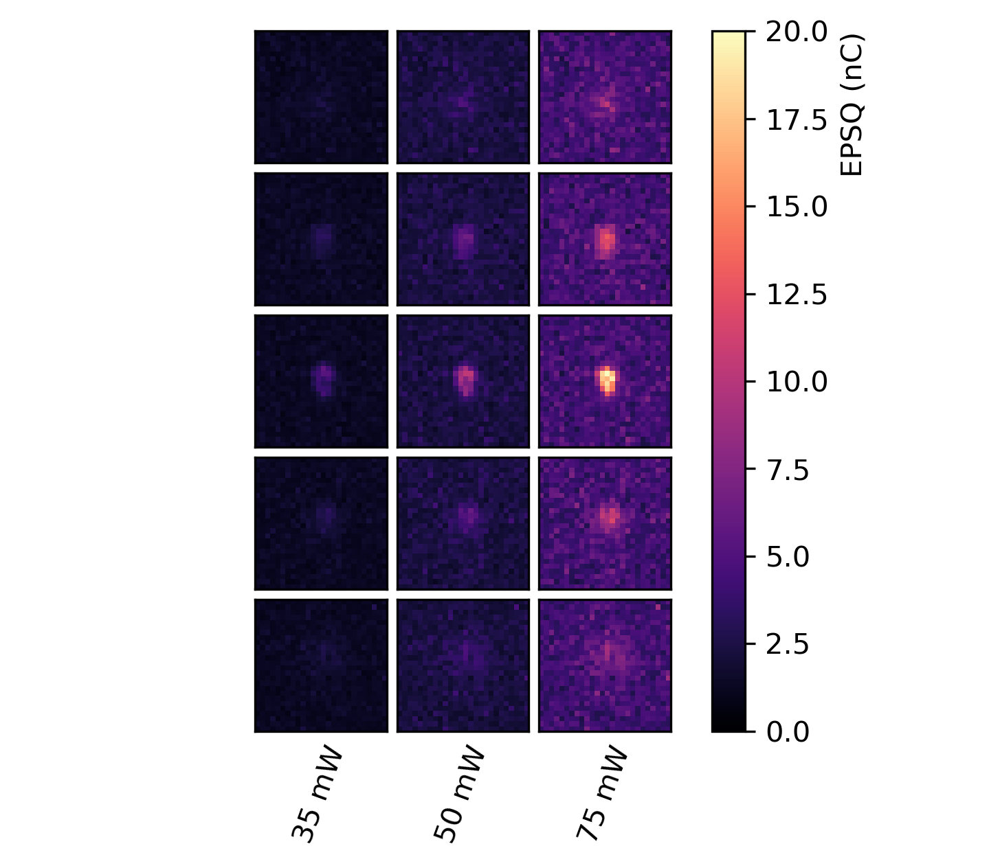

In [9]:
psc_tensor.shape

est_opsin_image = np.nanmean(np.nansum(psc_tensor[...,100:200], axis=-1), axis=-1)

fig = plt.figure(figsize=(6, 0.75 * 6), dpi=300, facecolor='white')

util.plot_multi_means(fig,
    [est_opsin_image], np.arange(5),
#     map_names=['subtracted'],
    cmaps=['magma', 'magma'],
    cbar_labels=['EPSQ (nC)'],
    vranges=[(0,20)],
    powers=np.unique(I))

## Subtraction methods


Running vanilla NMU on the multispot data doesn't seem to work, because we pick up PSCs. We'll revisit Liam's idea of using a two-step process:

1. fit U,V using 100 frames of data while stim is on
2. Solve QP to get V while holding U fixed


In [10]:
def _svd_estimate(tensor, rank=1):
    dims = tensor.shape
    ntimesteps = dims[-1]
    unfolded = tensor.reshape(-1, ntimesteps)
    U, S, VT = np.linalg.svd(unfolded)
    est =  (U[:, :rank] * S[:rank]) @ VT[:rank,:]
    return est.reshape(dims)
    
from jaxopt import OSQP, BoxOSQP,CvxpyQP
import jax
from jax import vmap
import jax

@jax.jit
def solve_r_subproblem_nonneg(G, R, Q):
    qp = OSQP(tol=1e-4)
    def run_qp_solver(obj_matrix, obj_vector, ineq_matrix, ineq_vector):

        # Warm start using the current value of R for the primal variable,
        # and the value of dual_r for the dual variable
        sol = qp.run(init_params=None, # no equality dual vars
                      params_obj=(obj_matrix, obj_vector),
                      params_eq=None,
                      params_ineq=(ineq_matrix, ineq_vector)).params
        return sol.primal, sol.dual_ineq
    N, T = G.shape
    
    ineq_matrix = jnp.concatenate((Q.T, -Q.T), axis=0)
    ineq_vector = jnp.concatenate((G, jnp.zeros((N, T))), axis=1)
    r_primal, r_dual = vmap(
        run_qp_solver,
        in_axes=(None, 0, None, 0))(Q @ Q.T, -G @ Q.T, ineq_matrix, ineq_vector)
    return r_primal, r_dual

def _scalar_underapprox(x, u):
    alpha_hat = jnp.linalg.norm(x) / jnp.linalg.norm(u)
    
    max_violation_idx = jnp.argmax(alpha_hat * u)
    val = jnp.all(alpha_hat * u <= x)
    return  val * alpha_hat + (1 - val) * (x[max_violation_idx] / u[max_violation_idx])

scalar_underapprox = jax.jit(vmap(_scalar_underapprox, in_axes=(1,None)))

def _nmu_estimate_stepwise(tensor, rank=1, stim_start=100, stim_end=200):
    dims = tensor.shape
    ntimesteps = dims[-1]
    X_full = tensor.reshape(-1, ntimesteps)
    X_stim = X_full[:, stim_start:stim_end]


    factors  = nmu.recursive_nmu(np.maximum(X_stim, 0), r=rank)
    U_stim = np.concatenate([factor[0] for factor in factors], axis=-1)
    V_stim = np.concatenate([factor[1] for factor in factors], axis=-1)

    if rank == 1:
        V_qp = scalar_underapprox(X_full, np.squeeze(U_stim))
        V_qp = V_qp[None,:] # turn into row vector
    else:
        V_qp = solve_r_subproblem_nonneg(X_full.T, V_stim.T, U_stim.T)[0].T

    est = U_stim @ V_qp
    return est.reshape(dims)


def _nmu_estimate_matrix(pscs, rank=1):
    factors  = nmu.recursive_nmu(np.maximum(pscs, 0), r=rank)
    est = np.zeros_like(pscs)
    for (u, v) in factors:
        est += np.outer(u, v)
    return est


def _nmu_estimate_tensor(tensor, rank=1):
    dims = tensor.shape
    ntimesteps = dims[-1]
    unfolded = tensor.reshape(-1, ntimesteps)
    factors  = nmu.recursive_nmu(np.maximum(unfolded, 0), r=rank)
    est = np.zeros_like(unfolded)
    for (u, v) in factors:
        est += np.outer(u, v)
    return est.reshape(dims)
    

def _parafac_estimate(tensor, rank=1):
    nx, ny, ntrials_curr, ntimesteps = tensor.shape
    reshaped = tensor.reshape(-1, ntrials_curr, ntimesteps)
    cptensor = parafac(np.maximum(reshaped, 0),
                               rank=rank,)

    return tl.cp_to_tensor(cptensor).reshape(nx, ny, ntrials_curr, ntimesteps)

def  estimate_photocurrents_multispot(pscs, I, rank=1):
    est = np.zeros_like(pscs)
    subtracted = np.zeros_like(pscs)
    for power_idx, power in enumerate(powers):
        these_trials = (I == power)
        pscs_cur = pscs[these_trials]
        est_cur = _nmu_estimate_matrix(pscs_cur, rank=rank)

        # store estimated waveforms and corrected traces
        subtracted[these_trials] = pscs_cur - est_cur
        est[these_trials] = est_cur


    return est, subtracted

def estimate_photocurrents_all_planes(roi_tensor, rank=1, stepwise=False):
    npowers, nx, ny, nz, ntrials, ntimesteps = roi_tensor.shape


    subtracted = np.copy(roi_tensor)
    full_est = np.copy(roi_tensor)
    

    for power_idx in range(npowers):

        # extract current tensor we're working with. Different powers
        # can have different numbers of trials, which are marked by np.nan
        try:
            ntrials_curr = np.where(np.isnan(roi_tensor[power_idx, 0, 0, 0, :, 0]))[0][0]
        except IndexError:
            ntrials_curr = ntrials

        # This forms an index to extract a particular (power, trials, plane) combination
        _slice = np.s_[power_idx, :, :, :, 0:ntrials_curr, :] 
        tensor_curr = roi_tensor[_slice]

        # Call one of our implemented methods on the data tensor
        if stepwise:
            est = _nmu_estimate_stepwise(tensor_curr, rank=rank)
        else:
            est = _nmu_estimate_tensor(tensor_curr, rank=rank)

        subtracted[_slice] = roi_tensor[_slice] - est
        full_est[_slice] = est


    return full_est, subtracted

def estimate_photocurrents(roi_tensor, separate_by_powers=True, rank=1, l2_reg=0.0, method='nmu'):

    _algs = dict(
        nmu=_nmu_estimate_tensor,
        parafac=_parafac_estimate,
        svd=_svd_estimate
    )
    if method not in _algs:
        raise ValueError('method must be one of %s' % [x for x in _algs.keys()])

    npowers, nx, ny, nz, ntrials, ntimesteps = roi_tensor.shape


    subtracted = np.copy(roi_tensor)
    full_est = np.copy(roi_tensor)
    
    for z_idx in range(nz):

        for power_idx in range(npowers):

            # extract current tensor we're working with. Different powers
            # can have different numbers of trials, which are marked by np.nan
            try:
                ntrials_curr = np.where(np.isnan(roi_tensor[power_idx, 0, 0, 0, :, 0]))[0][0]
            except IndexError:
                ntrials_curr = ntrials

            # This forms an index to extract a particular (power, trials, plane) combination
            _slice = np.s_[power_idx, :, :, z_idx, 0:ntrials_curr, :] 
            tensor_curr = roi_tensor[_slice]

            # Call one of our implemented methods on the data tensor
            est = _algs[method](tensor_curr, rank=rank)

            subtracted[_slice] = roi_tensor[_slice] - est
            full_est[_slice] = est


    return full_est, subtracted

def traces_tensor_to_map(tensor):
    return np.nansum(np.nanmean(tensor, axis=-1), axis=-1)

def plot_subtraction(roi_tensor, est, subtracted_roi_tensor,
        order=None, num_plots=30, power_idx=-1, ylim=None):
    npowers, nx, ny, nz, ntrials, ntimesteps = roi_tensor.shape
    roi_traces, est_traces, subtracted_traces = [x[-1,...].reshape(-1, ntrials, ntimesteps)
        for x in [roi_tensor, est, subtracted_roi_tensor]]

    if order is None:
        mean_map_raw = traces_tensor_to_map(roi_traces)
        order = np.argsort(mean_map_raw)[::-1]

    fig, axs = plt.subplots(nrows=num_plots, ncols=3, figsize=(10,num_plots*1.5), sharey=True, dpi=300, sharex=True)

    for i in range(num_plots):
        idx = order[i]
        axs[i, 0].plot(roi_traces[idx].T)
        axs[i, 1].plot(est_traces[idx].T)
        axs[i, 2].plot(subtracted_traces[idx].T)

        if ylim is not None:
            for j in range(3):
                axs[i,j].set_ylim(*ylim)

def plot_subtraction_comparison_multispot(roi_traces, est_traces, subtracted_roi_traces, demixed_roi_traces,
        colors=['red', 'blue'], order=None,
        num_plots=30,
        ylims=None, override_sharey=False):

    # # see if we should restrict plot to only one plane
    # npowers, nx, ny, nz, ntrials, ntimesteps = roi_tensor.shape
    # if z_idx is None:
    #     z_idx = np.arange(nz)

    sharey=True
    if ylims is not None:
        sharey=False

    if override_sharey is not None:
        sharey=override_sharey


    fig, axs = plt.subplots(nrows=num_plots, ncols=4, figsize=(10,num_plots*1.5),
        sharey=sharey, dpi=300, sharex=True, facecolor='white')
    # npowers, nx, ny, nz, ntrials, ntimesteps = roi_tensor.shape

    # get order from raw traces
    if order is None:
        order = np.argsort(roi_traces.sum(1))[::-1]

    # plot raw traces outside of the loop over subtraction methods
    for i in range(num_plots):
        idx = order[i]
        axs[i, 0].plot(roi_traces[idx].T)

    # title each column
    titles = ['raw', 'est', 'subtracted', 'demixed']
    for j in range(4):
        axs[0,j].set_title(titles[j])

    # iterate over maps corresponding to different subtraction methods, plot each
    # in a different color
    for (est_cur, subtracted_cur, demixed_cur, color) in zip(
        est_traces, subtracted_roi_traces, demixed_roi_traces, colors):

         
        for i in range(num_plots):
            idx = order[i]
            axs[i, 1].plot(est_cur[idx].T, color=color, linewidth=0.5)
            axs[i, 2].plot(subtracted_cur[idx].T, color=color, linewidth=0.5)
            axs[i, 3].plot(demixed_cur[idx].T, color=color, linewidth=0.5)

            if ylims is not None:
                for j in range(4):
                    axs[i,j].set_ylim(*ylims[j])

            for j in range(4):
                axs[i,j].axvline(x=100)
                axs[i,j].axvline(x=200)

    return fig, axs


def plot_subtraction_comparison(roi_tensor, ests, subtracted_roi_tensors, demixed_roi_tensors,
        colors=['red', 'blue'], order=None,
        num_plots=30, power_idx=-1, z_idx=None,
        ylims=None, override_sharey=False):

    # see if we should restrict plot to only one plane
    npowers, nx, ny, nz, ntrials, ntimesteps = roi_tensor.shape
    if z_idx is None:
        z_idx = np.arange(nz)

    sharey=True
    if ylims is not None:
        sharey=False

    if override_sharey is not None:
        sharey=override_sharey


    fig, axs = plt.subplots(nrows=num_plots, ncols=4, figsize=(10,num_plots*1.5),
        sharey=sharey, dpi=300, sharex=True, facecolor='white')
    npowers, nx, ny, nz, ntrials, ntimesteps = roi_tensor.shape

    # get order from raw traces
    roi_traces = roi_tensor[power_idx,:,:,z_idx,...].reshape(-1, ntrials, ntimesteps)
    if order is None:
        mean_map_raw = traces_tensor_to_map(roi_traces)
        order = np.argsort(mean_map_raw)[::-1]

    # plot raw traces outside of the loop over subtraction methods
    for i in range(num_plots):
        idx = order[i]
        axs[i, 0].plot(roi_traces[idx].T)

    # title each column
    titles = ['raw', 'est', 'subtracted', 'demixed']
    for j in range(4):
        axs[0,j].set_title(titles[j])

    # iterate over maps corresponding to different subtraction methods, plot each
    # in a different color
    for (est, subtracted_roi_tensor, demixed_tensor, color) in zip(
        ests, subtracted_roi_tensors, demixed_roi_tensors, colors):

        

        est_traces, subtracted_traces, demixed_traces = [x[power_idx,:,:,z_idx,...].reshape(-1, ntrials, ntimesteps)
            for x in [est, subtracted_roi_tensor, demixed_tensor]]
        
        
        for i in range(num_plots):
            idx = order[i]
            axs[i, 1].plot(est_traces[idx].T, color=color, linewidth=0.5)
            axs[i, 2].plot(subtracted_traces[idx].T, color=color, linewidth=0.5)
            axs[i, 3].plot(demixed_traces[idx].T, color=color, linewidth=0.5)

            if ylims is not None:
                for j in range(4):
                    axs[i,j].set_ylim(*ylims[j])

            for j in range(4):
                axs[i,j].axvline(x=100)
                axs[i,j].axvline(x=200)

    return fig, axs


def demix_roi_traces(roi_tensor, demixer_checkpoint):
    # load demixer
    demixer = NeuralDemixer(path=demixer_checkpoint)
    dims = roi_tensor.shape
    ntimesteps = dims[-1]
    raw_traces = roi_tensor.reshape(-1, ntimesteps)
    demixed_traces = util.denoise_pscs_in_batches(raw_traces, demixer)
    return demixed_traces.reshape(dims)





In [20]:
est_nmu = _nmu_estimate_stepwise(np.maximum(pscs, 0), rank=1)
subtracted_nmu = pscs - est_nmu

est_tensor = util.make_psc_tensor_multispot(est_nmu, I, L, stim, num_rounds=3)
subtracted_tensor = util.make_psc_tensor_multispot(subtracted_nmu, I, L, stim, num_rounds=3)

In [21]:
subtracted_nmu = np.array(subtracted_nmu)

In [22]:
demixer_checkpoint = "/Users/Bantin/Documents/Columbia/Projects/2p-opto/circuit_mapping/demixers/nwd_ee_ChroME1.ckpt"
demixer = NeuralDemixer(path=demixer_checkpoint)
subtracted_demixed_tensor = util.make_psc_tensor_multispot(util.denoise_pscs_in_batches(subtracted_nmu, demixer),
    I, L, stim, num_rounds=3)


/Users/bantin/Documents/Columbia/Projects/2p-opto/circuit_mapping/circuitmap/neural_waveform_demixing.py:45: RuntimeWarning: invalid value encountered in true_divide
  torch.Tensor((traces/tmax).copy()[:, None, :]).to(device=self.device)


/var/folders/67/j86q1s2s1_dg5m568j2k9d040000gn/T/ipykernel_36890/2234795538.py:181: RuntimeWarning: Mean of empty slice
  return np.nansum(np.nanmean(tensor, axis=-1), axis=-1)


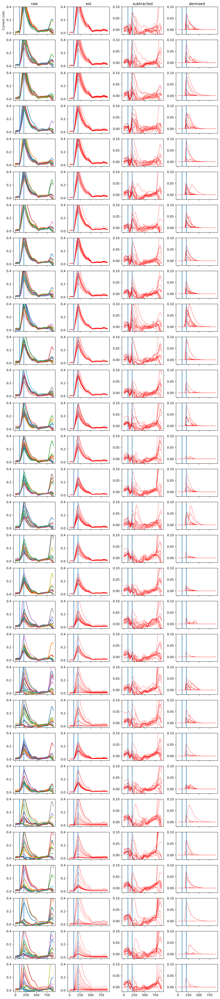

In [23]:

fig, axs = plot_subtraction_comparison(psc_tensor, [est_tensor,], [subtracted_tensor, ],
    [subtracted_demixed_tensor, ],
    ylims=[(-0.02, 0.4,), (-0.02, 0.4), (-0.02, 0.1), (-0.02, 0.1)],
    z_idx=2,
    # override_sharey=False)
)
axs[0,0].set_ylabel('Current (nA)')

plt.tight_layout()

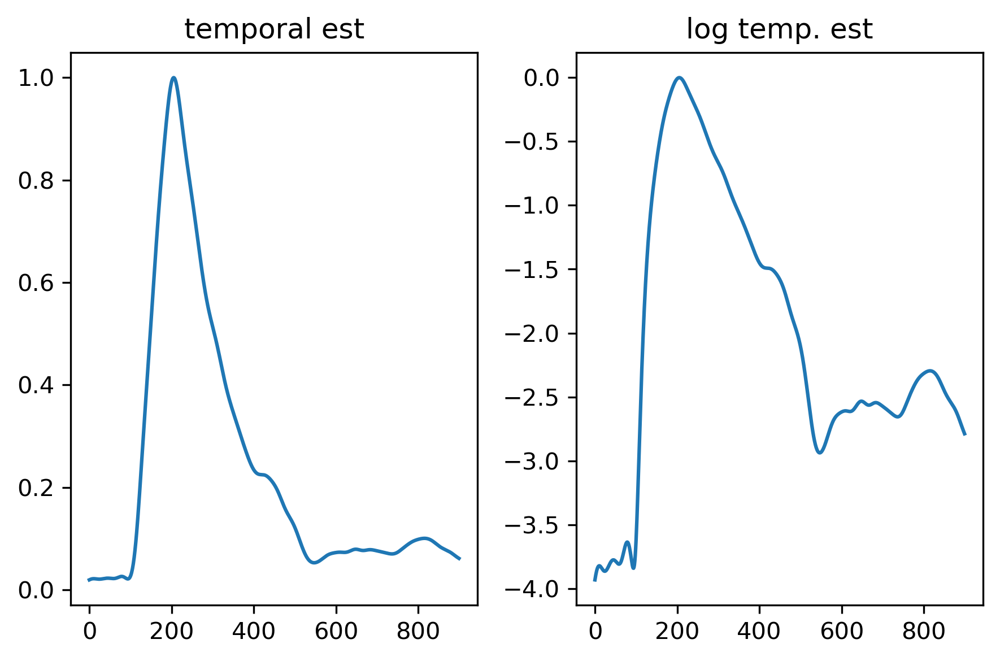

In [35]:
fig, axs = plt.subplots(nrows=1, ncols=2,)
temp_est = est_nmu[100] / np.max(est_nmu[100])
axs[0].plot(temp_est)
axs[0].set_title('temporal est')

axs[1].set_title('log temp. est')
axs[1].plot(np.log(temp_est))
plt.tight_layout()

**Plot demixed + subtracted maps**

Hard to tell if the demixed residual shapes are reasonable. Maybe map across powers will be informative?

/var/folders/67/j86q1s2s1_dg5m568j2k9d040000gn/T/ipykernel_22129/3812301296.py:100: RuntimeWarning: Mean of empty slice
  return np.nansum(np.nanmean(tensor, axis=-1), axis=-1)


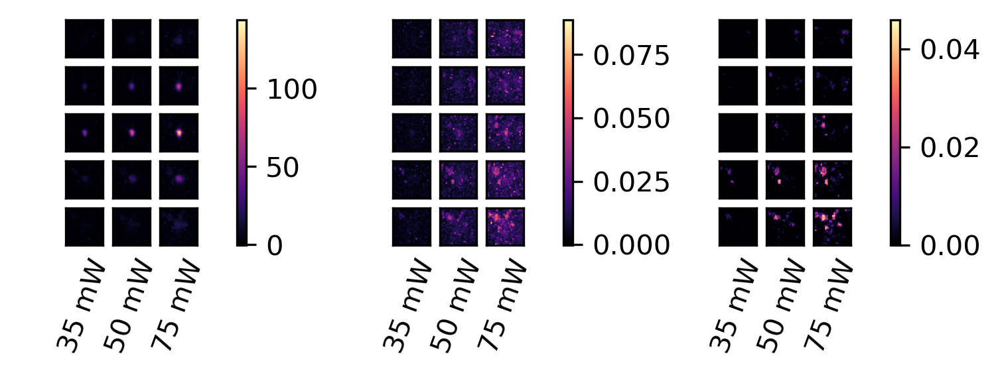

In [44]:


psc_tensor_subtracted = psc_tensor.copy()
psc_tensor_subtracted[P,X,Y,Z,:,0:t_max] = subtracted_nmu
mean_map_subtracted = traces_tensor_to_map(psc_tensor_subtracted)

psc_tensor_demixed = demix_roi_traces(psc_tensor_subtracted, demixer_checkpoint)
mean_map_demixed = traces_tensor_to_map(psc_tensor_demixed)


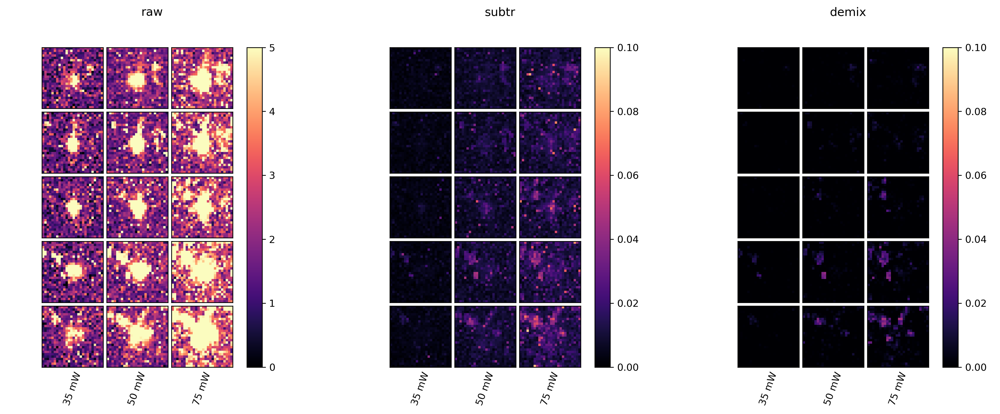

In [71]:

fig = plt.figure(figsize=(18, 6), dpi=300, facecolor='white')

util.plot_multi_means(fig,
    [grid_mean, mean_map_subtracted, mean_map_demixed], np.arange(num_planes),
#     map_names=['subtracted'],
    cmaps=['magma', 'magma', 'magma'],
    # cbar_labels=['EPSQ (nC)'],
    # zlabels=['subtr', 'demix'],
    map_names=['raw', 'subtr', 'demix'],
    vranges=[(0,5), (0,0.1), (0,0.1)],
    powers=np.unique(I))

## Plot traces to check whether map is reasonable

This time we'll reuse the plot_subtraction_comparison function but hand-specify the order to look at the largest subtracted_traces first. We'll also look at the bottom plane since there seems to be more connectivity there.

> /var/folders/67/j86q1s2s1_dg5m568j2k9d040000gn/T/ipykernel_22129/1647746936.py(154)plot_subtraction_comparison()
    152     # plot raw traces outside of the loop over subtraction methods
    153     import pdb; pdb.set_trace()
--> 154     for i in range(num_plots):
    155         idx = order[i]
    156         axs[i, 0].plot(roi_traces[idx].T)



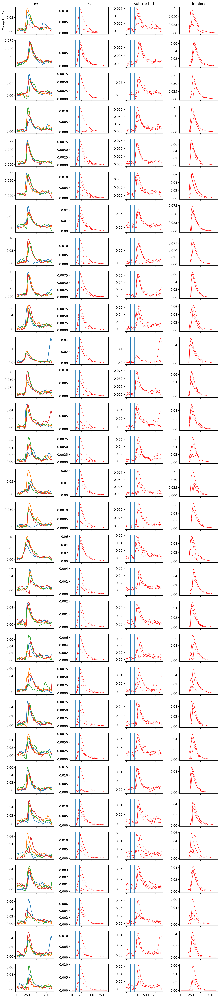

In [69]:
power_idx = -1
z_idx = -1

ntrials, ntimesteps = roi_tensor.shape[-2:]
demixed_traces = subtracted_demixed_nmu[power_idx,:,:,z_idx,...].reshape(-1, ntrials, ntimesteps)
mean_map_raw = traces_tensor_to_map(demixed_traces)
order = np.argsort(mean_map_raw)[::-1]

fig, axs = plot_subtraction_comparison(roi_tensor, [est_nmu, ], [subtracted_nmu, ],
    [subtracted_demixed_nmu, ],
    # ylims=[(-0.00, 0.09,), (-0.00, 0.09), (-0.02, 0.05), (-0.02, 0.05)],
    z_idx=z_idx, power_idx=power_idx, order=order,
    override_sharey=False)
axs[0,0].set_ylabel('Current (nA)')

plt.tight_layout()